# Data loading

In [1]:
!pip install einops

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.5 MB/s eta 0:00:00


In [2]:
!pip install natsort

In [3]:
import einops
import imageio
import numpy as np
import os


from tqdm.auto import tqdm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import DataLoader

from torchvision.transforms import Compose, ToTensor, Lambda, Resize
from torchvision.transforms import functional


SEED = 0
np.random.seed(SEED)
torch.manual_seed(SEED)

In [4]:
def show_images(images, title=""):
    """Shows the provided images as sub-pictures in a square"""

    # Converting images to CPU numpy arrays
    if type(images) is torch.Tensor:
        images = images.detach().cpu().permute(0,2,3,1).numpy()

    # Defining number of rows and columns
    fig = plt.figure(figsize=(8, 8))
    rows = int(len(images) ** (1 / 2))
    cols = round(len(images) / rows)

    # Populating figure with sub-plots
    idx = 0
    for r in range(rows):
        for c in range(cols):
            fig.add_subplot(rows, cols, idx + 1)

            if idx < len(images):
                plt.imshow((255*(images[idx]+1)/2).astype('uint8'))
                idx += 1
    fig.suptitle(title, fontsize=30)
    plt.show()

In [6]:
from torchvision import transforms

image_size = 32
t_normalize = lambda x: x * 2 - 1
transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    t_normalize,
])

In [7]:
from natsort import natsorted
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import re
import os

CUR_DIR = "/kaggle/input/celeba/"


class CelebaCustomDataset(Dataset):
    def __init__(self, root_dir=CUR_DIR, transform=None):
        if not os.path.isdir(root_dir):
            os.makedirs(root_dir)
        dataset_folder = f'{root_dir}img_align_celeba/img_align_celeba/'
        self.dataset_folder = os.path.abspath(dataset_folder)

        image_names = os.listdir(self.dataset_folder)

        self.transform = transform
        image_names = natsorted(image_names)

        self.filenames = []
        self.annotations = []
        with open(f'{root_dir}list_attr_celeba.txt') as f:
            for i, line in enumerate(f.readlines()):
                line = re.sub(' *\n', '', line)
                if i == 0 or i == 1:
                    self.header = re.split(' +', line)
                else:
                    values = re.split(' +', line)
                    filename = values[0]
                    self.filenames.append(filename)
                    self.annotations.append([int(v) for v in values[1:]])

        self.annotations = np.array(self.annotations)

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        img_name = self.filenames[idx]
        img_path = os.path.join(self.dataset_folder, img_name)
        img_attributes = self.annotations[idx]

        img = Image.open(img_path).convert('RGB')

        if self.transform:
            img = self.transform(img)
        return img, {'filename': img_name, 'idx': idx, 'attributes': torch.tensor(img_attributes).long()}


dataset = CelebaCustomDataset(transform=transform)

img = dataset[0]
img[0].shape

torch.Size([3, 32, 32])

In [10]:
batch_size = 128
loader = DataLoader(dataset, batch_size, shuffle=True, num_workers=4)

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}\t" + (f"{torch.cuda.get_device_name(0)}" if torch.cuda.is_available() else "CPU"))

Using device: cuda	Tesla P100-PCIE-16GB


# Denoising Diffusion Model (DDPM)

## Recap
Диффузия - это обратимый стохастический процесс, в котором картинка зашумляется по известному гауссовскому закону $q(x_t|x_{t-1})$ и денойзится по неизвестному обратному гауссовскому закону $p(x_{t-1}|x_t)$, который приближается нейросетью $p_\theta$
![](https://lilianweng.github.io/posts/2021-07-11-diffusion-models/DDPM.png)

Известный закон $q$ (он же forward pass) описывается по формуле:
$$
\begin{aligned}
\mathbf{x}_t
&= \sqrt{\alpha_t}\mathbf{x}_{t-1} + \sqrt{1 - \alpha_t}\boldsymbol{\epsilon}_{t-1} & \text{ ;where } \boldsymbol{\epsilon}_{t-1}, \boldsymbol{\epsilon}_{t-2}, \dots \sim \mathcal{N}(\mathbf{0}, \mathbf{I}) \\
&= \sqrt{\alpha_t \alpha_{t-1}} \mathbf{x}_{t-2} + \sqrt{1 - \alpha_t \alpha_{t-1}} \bar{\boldsymbol{\epsilon}}_{t-2} & \text{ ;where } \bar{\boldsymbol{\epsilon}}_{t-2} \text{ merges two Gaussians (*).} \\
&= \dots \\
&= \sqrt{\bar{\alpha}_t}\mathbf{x}_0 + \sqrt{1 - \bar{\alpha}_t}\boldsymbol{\epsilon} \\
q(\mathbf{x}_t \vert \mathbf{x}_0) &= \mathcal{N}(\mathbf{x}_t; \sqrt{\bar{\alpha}_t} \mathbf{x}_0, (1 - \bar{\alpha}_t)\mathbf{I})
\end{aligned}
$$, где $\alpha$ - заранее определенные по определенной сетке константы

Неизвестная же гауссиана обратного закона (он же backward pass) предсказывается нейросетью:
$p_\theta(x_{t-1}|x_t) = \mathcal{N}(x_{t-1};\mu_\theta(x_t, t),\sigma_\theta(x_t,t))$ (т.е. предсказываются $\mu$ и $\sigma$, точно как в вариационном энкодере)

Кроме этого, так же, как в варэнкодере, $p_\theta$ выучивается максимизацией ELBO (и даже KL там тоже между двумя гауссианами)

Как только выучен обратный процесс денойзинга $p_\theta(x_{t-1}|x_t)$, дело остаётся за малым: берём $x_T\sim\mathcal{N}(0,1)$ и семплируем $x_{t-1}\sim p_\theta(x_{t-1}|x_t)$, пока не восстановим наш незашумленный $x_0$. Это и будет картинка

## DDPM

Авторы DDPM решили сделать $\sigma_t$ заранее определённой константой, например:
- $\sigma_t^2$ = $\beta_t$
- $\sigma_t^2$ = $\frac{1 - \bar{\alpha_{t-1}}}{1 - \bar{\alpha_{t}}} \beta_t$

Тогда
$$q(x_{t-1}|x_0, x_t)=\mathcal{N}(x_{t-1}|\mu_t^q,\sigma_t)$$
$$p_\theta(x_{t-1}|x_t)=\mathcal{N}(x_{t-1}|\mu_t^\theta,\sigma_t)$$

Кроме этого, из вышеуказанного прямого закона $q$ несложно представить $\mu_t^q$ в виде

$$\boldsymbol{\mu}^q_t = \frac{1}{\sqrt{\alpha_t}} \Big( \mathbf{x}_t - \frac{1 - \alpha_t}{\sqrt{1 - \bar{\alpha}_t}} \boldsymbol{\epsilon}_t \Big)$$

Так давайте представим и $\mu^\theta_t$ в таком виде, раз так:
$$\boldsymbol{\mu}^\theta_t = \frac{1}{\sqrt{\alpha_t}} \Big( \mathbf{x}_t - \frac{1 - \alpha_t}{\sqrt{1 - \bar{\alpha}_t}} \boldsymbol{\epsilon}_t^\theta(x_t,t) \Big)$$

Тогда весь $KL(q|p_\theta)$ сведётся к минимизации MSE

$$||\mu_t^q-\mu_t^\theta||^2\sim||\epsilon_t-\epsilon_t^\theta(x_t,t)||^2$$

А зашумленный $x_t$ можно считать из исходного $x_0$ по быстрой формуле (см. самое начало):

$$x_t=\sqrt{\bar{\alpha}_t}\mathbf{x}_0 + \sqrt{1 - \bar{\alpha}_t}\boldsymbol{\epsilon}_t$$

$\epsilon_t$ же на деле берут случайно из $\mathcal{N}(0,1)$

Итого, диффузии отдалённо можно представить в виде нескольких строк кода:
![](https://lilianweng.github.io/posts/2021-07-11-diffusion-models/DDPM-algo.png)

Прим. В качестве $\epsilon^\theta$ берут любой Unet-like backbone (кроме этого, есть оптимизированный под диффузию Efficient Unet)


In [12]:
class DDPM(nn.Module):
    def __init__(self, network, 
                 n_steps=1000, 
                 min_beta=1e-5, 
                 max_beta=1e-2, 
                 device=None,
                 image_chw=(3, image_size, image_size)):
        super().__init__()
        self.n_steps = n_steps
        self.device = device
        self.image_chw = image_chw
        self.network = network.to(device) 
        self.betas = torch.linspace(min_beta, max_beta, n_steps) 
        self.alphas = 1 - self.betas

    def forward(self, x0, t, eta=None):
        # Прямой проход диффузии (детерменированный марковский процесс)
        # :param x0 - исходная картинка (тензор формы [B,C,H,W])
        # :param t - шаг зашумления (тензор формы [B,1])
        # :param eta - \epsilon_t - добавочный шум на шаге зашумления t (тензор формы [B,C,H,W])

        if eta is None:
            eta = torch.zeros(x0.shape[0], x0.shape[1], x0.shape[2], x0.shape[3]).normal_() # если шум не определен - инициализируйте его гауссом N(0,1) сами
        alpha_bar = torch.tensor([torch.prod(self.alphas[:int(t[i][0])]) for i in range(t.shape[0])]).reshape(-1, 1, 1, 1)
        noised_x =  x0 * torch.sqrt(alpha_bar) + torch.sqrt(1 - alpha_bar) * eta
        return noised_x

    def backward(self, x, t):
        # Обратный процесс. Здесь восстановливается добавочный шум eta из зашумлённой картинки x на шаге t нейросетью
        eta_pred = self.network(x, t)
        return eta_pred

# Visualizing forward and backward 

In [13]:
def show_forward(ddpm, loader, device):
    for batch in loader:
        imgs = batch[0]

        show_images(imgs, "Original images")

        for percent in [0.25, 0.5, 0.75, 1]: # Шаг зашумления (в процентах от максимального)
            noised_images = ddpm(imgs, torch.tensor([percent * 1000 for i in range(imgs.shape[0])]).reshape(-1, 1) ) # YOUR CODE HERE. Зашумите ваши картинки прямым проходом DDPM
            show_images(
                noised_images,
                f"DDPM Noisy images {int(percent * 100)}%"
            )
        break

In [14]:
def generate_new_images(ddpm, n_samples=16, device=None, frames_per_gif=100,
                        gif_name="sampling.gif", c=3, h=image_size, w=image_size):
    """Given a DDPM model, a number of samples to be generated and a device, returns some newly generated samples"""
    frame_idxs = np.linspace(0, ddpm.n_steps - 1, frames_per_gif).astype(np.uint)
    frames = []

    with torch.no_grad():
        if device is None:
            device = ddpm.device

        x = torch.zeros(n_samples, c, h, w).normal_() # Начинаем генерить картинки с гауссовского шума N(0,1) ([n_samples, c, h, w])
        x = x.to(device)
        # Денойзим наши картинки для каждого шага, начиная с последнего:
        for idx, t in enumerate(reversed(np.arange(1, 1000))):
            time_tensor =  torch.tensor([int(t) for _ in range(n_samples)]).reshape(-1, 1) # [n_samples, 1].long()
            time_tensor = time_tensor.to(device)
            eta_theta = ddpm.network(x, time_tensor) #Предсказываем добавочный шум нейросетью
            alpha_t = ddpm.alphas[t - 1].to(device)
            alpha_ = torch.prod(ddpm.alphas[:int(time_tensor[0][0])])
            alpha_t_bar = torch.tensor([alpha_ for _ in range(time_tensor.shape[0])]
                                       ).reshape(-1, 1, 1, 1).to(device)

            x = (x - ((1 - alpha_t) / torch.sqrt(1 - alpha_t_bar) * eta_theta)) / torch.sqrt(alpha_t) # Вычитаем добавочный шум из картинки
            if t > 1:
                z = torch.randn(n_samples, c, h, w).to(device)
                sigma_t = ddpm.betas[t].to(device) 
                x = x + sigma_t * z

            # Добавляем кадры в GIF
            if idx in frame_idxs or t == 1:
                normalized = x.clone()
                normalized_show = 255 * (normalized + 1) / 2
           
                frame = einops.rearrange(torch.clip(normalized_show, 0, 255), "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(n_samples ** 0.5))
                frame = frame.cpu().numpy().astype(np.uint8)
                frames.append(frame)

    # Сохраняем gif
    with imageio.get_writer(gif_name, mode="I") as writer:
        for idx, frame in enumerate(frames):
            writer.append_data(frame)
            if idx == len(frames) - 1:
                for _ in range(frames_per_gif // 3):
                    writer.append_data(frames[-1])
    return x

# Unet

In [15]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
        )

    def forward(self, x):
        return self.conv(x)

In [16]:
def sinusoidal_embedding(n, d):
    # n - размерность исходных данных (в нашем случае число моментов времени)
    # d - выходная размерность
    embedding = torch.zeros(n, d)
    dropout = nn.Dropout(0.15)
    wk = torch.tensor([1 / 10_000 ** (2 * j / d) for j in range(d)]) # коэффициенты для d гармоник
    wk = wk.reshape((1, d))
    t = torch.arange(n).reshape((n, 1))
    d1 = d // 2
    coss = torch.cat([torch.cos(wk[:, d1:] * t[i]).reshape(1, -1) for i in range(n)],
                     axis=0)
    sins = torch.cat([torch.sin(wk[:, :d1] * t[i]).reshape(1, -1) for i in range(n)],
                     axis=0)
    embedding = torch.cat([sins, coss], axis=1)
    return dropout(embedding)


class UNet(nn.Module):
    def __init__(self, 
                 n_steps=1000, 
                 time_emb_dim=100, 
                 in_channels = 3, 
                 out_channels = 3,
                 out_channels_list = [32, 64, 128]
                ):
        super().__init__()
        self.time_embed = nn.Embedding(n_steps, time_emb_dim)
        self.time_embed.weight.data = sinusoidal_embedding(n_steps, time_emb_dim)
        self.time_embed.requires_grad_(False) # мы эмбединг слой уже инициализировали и менять его не будем
        
        self.down = nn.ModuleList()
        self.up = nn.ModuleList()
        self.pool = nn.MaxPool2d(2, 2)  # Phase change
        for out_channel_ in out_channels_list:
            self.down.append(ConvBlock(in_channels=in_channels, out_channels=out_channel_))
            in_channels = out_channel_
        for out_channel_ in reversed(out_channels_list):
            self.up.append(
                nn.ConvTranspose2d(
                    in_channels=out_channel_ * 2,
                    out_channels=out_channel_,
                    kernel_size=2,
                    stride=2,
                )
            )
            self.up.append(
                ConvBlock(
                    in_channels=out_channel_ * 2, out_channels=out_channel_
                ) 
            )
        self.bottleneck = ConvBlock(
            in_channels=out_channels_list[-1], out_channels=out_channels_list[-1] * 2
        )
        
        self.final_conv = nn.Conv2d(
            in_channels=out_channels_list[0], out_channels=out_channels, kernel_size=1
        )
        self.te = self.make_te(time_emb_dim, 3)
        
        
    def make_te(self, dim_in, dim_out):
        return nn.Sequential(
            nn.Linear(dim_in, dim_out),
            nn.SiLU(),
            nn.Linear(dim_out, dim_out)
        )
    
    
    def forward(self, x, t):
        t = self.te(self.time_embed.weight.data[t - 1])
        n = len(x)
        x = x + t.reshape(n, -1, 1, 1)
        
        skip_connections = []  
        for down in self.down:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]  
        for idx in range(0, len(self.up), 2):
            x = self.up[idx](x)
            skip_connection = skip_connections[idx // 2]
            if x.shape != skip_connection.shape:
                x = functional.resize(x, size=skip_connection.shape[2:])
            concat_skip = torch.cat((skip_connection, x), dim=1)  
            x = self.up[idx + 1](concat_skip)
        return self.final_conv(x)

In [17]:
# Defining model
n_steps, min_beta, max_beta = 1000, 1e-5, 1e-2
ddpm = DDPM(UNet(n_steps, time_emb_dim=100), n_steps=n_steps, min_beta=min_beta, 
            max_beta=max_beta, device=device)

In [18]:
sum([p.numel() for p in ddpm.parameters()])

2027390

# Optional visualizations

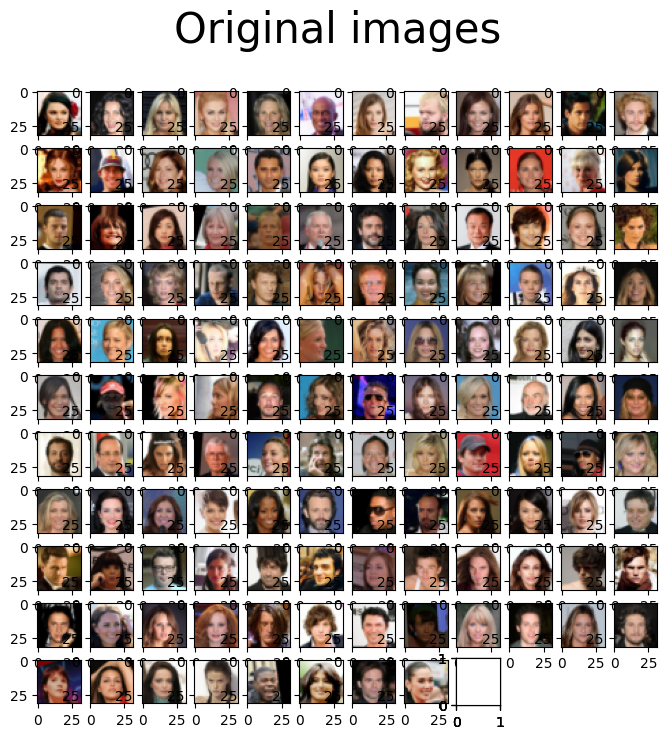

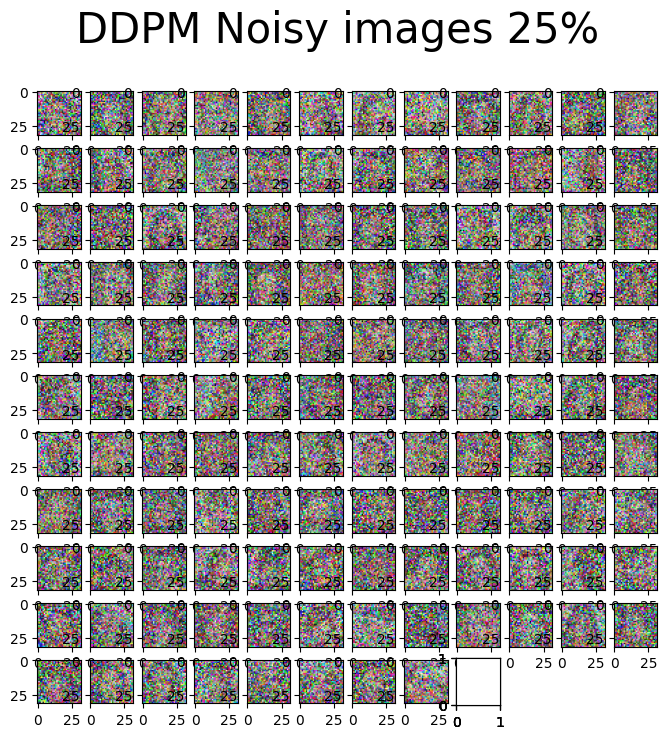

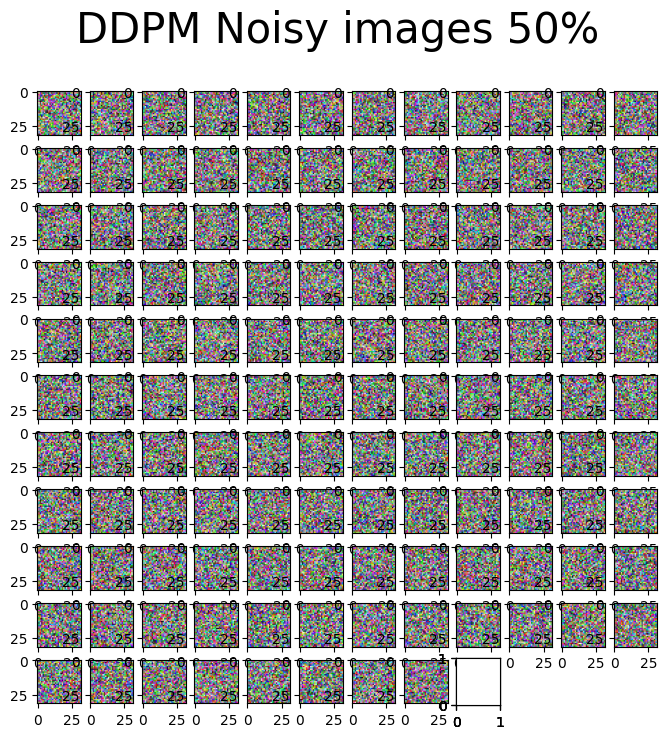

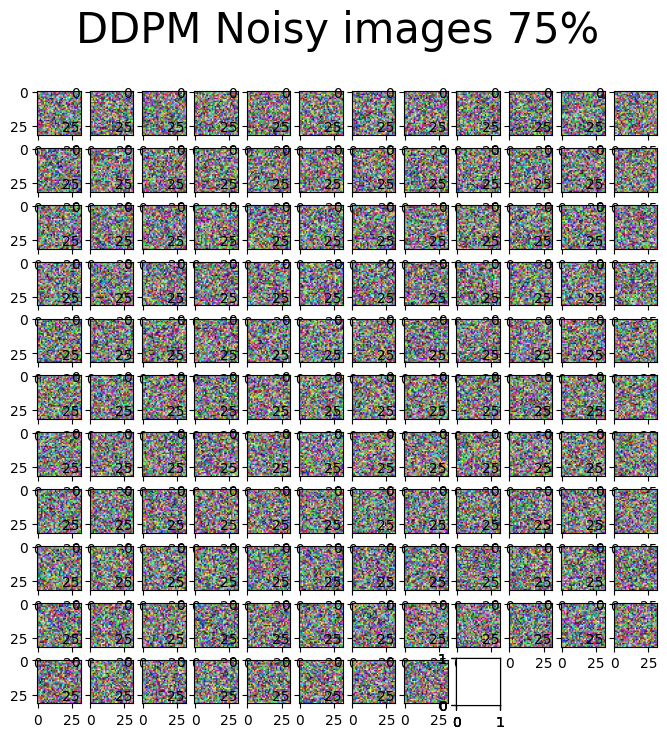

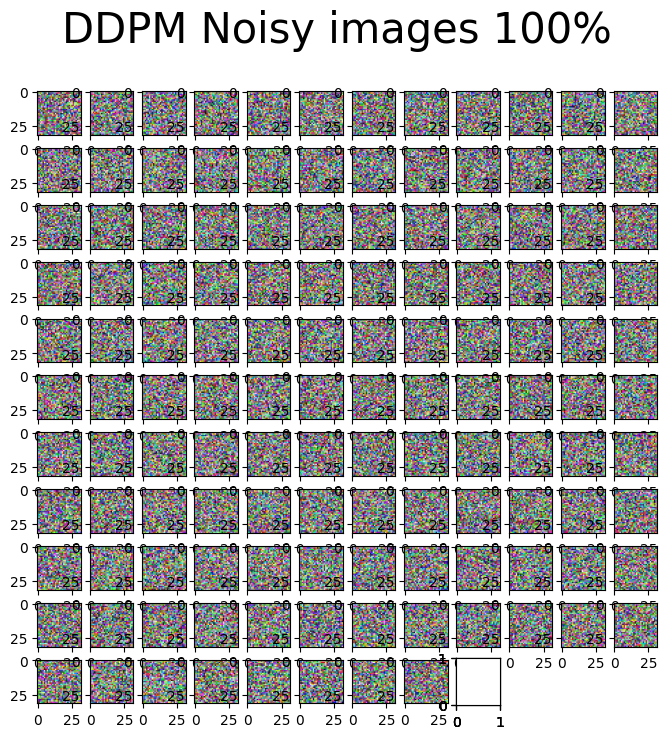

In [19]:
# The diffusion (forward) process
show_forward(ddpm, loader, device)

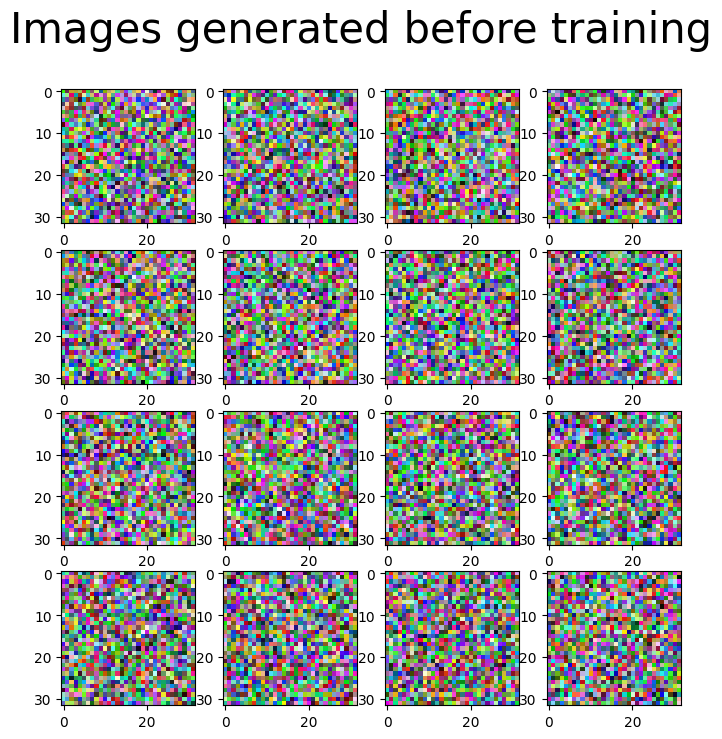

In [20]:
# The denoising (backward) process
generated = generate_new_images(ddpm, gif_name="before_training.gif")
show_images(generated, "Images generated before training") 

# Training
![](https://lilianweng.github.io/posts/2021-07-11-diffusion-models/DDPM-algo.png)

In [21]:
import wandb
wandb.login()

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [22]:
wandb.init(
    # set the wandb project where this run will be logged
    project="ddpm",
    
    # track hyperparameters and run metadata
    config={
    "learning_rate": 1.5e-3, 
    "dropout": 0.1,
    "emb": 100,
    "arch": "diff embed"
    }
)

wandb: Currently logged in as: ntyazh (ntyazh-team). Use `wandb login --relogin` to force relogin


In [32]:
def training_loop(ddpm, loader, n_epochs, optim, device, display=False, store_path="ddpm_model.pth"):
    mse = nn.MSELoss()
    best_loss = float("inf")
    n_steps = ddpm.n_steps
    ddpm.train()
    for epoch in tqdm(range(n_epochs), desc=f"Training progress", colour="#00ff00"):
        epoch_loss = 0.0
        for step, batch in enumerate(tqdm(loader, leave=False, desc=f"Epoch {epoch + 1}/{n_epochs}", colour="#005500")):
            x0 = batch[0].to(device)

            eta = torch.zeros(x0.shape[0], x0.shape[1], x0.shape[2], x0.shape[3]).normal_().to(device) # Инициализируем добавочный шум
            t = int(torch.zeros(1).uniform_(1, n_steps))

            alpha_ = torch.prod(ddpm.alphas[:t])
            alpha_t_bar = torch.tensor([alpha_ for _ in range(x0.shape[0])]
                                       ).reshape(-1, 1, 1, 1).to(device)

            time_tensor =  torch.tensor([int(t) for _ in range(x0.shape[0])]).reshape(-1, 1).to(device)
            noisy_imgs =  torch.sqrt(alpha_t_bar) * x0 + torch.sqrt(1 - alpha_t_bar) * eta # Получаем зашумленное изображение для шага t
            eta_theta = ddpm.network(noisy_imgs, time_tensor) # Восстанавливаем добавочный шум
   
            loss = mse(eta_theta, eta) # Учимся его восстанавливать нейросетью
            optim.zero_grad()
            loss.backward()
            optim.step()

            epoch_loss += loss.item() * len(x0) / len(loader.dataset)

        log_string = f"Loss at epoch {epoch + 1}: {epoch_loss:.3f}"
        wandb.log({"loss": epoch_loss})
        # Сохраняем модель
        if best_loss > epoch_loss:
            best_loss = epoch_loss
            log_string += " --> Best model ever (stored)"
        torch.save(ddpm.state_dict(), os.path.join(store_path, f"ddpm_{epoch+1}.pth"))
        generated = generate_new_images(ddpm)
        show_images(torch.clip(generated,-1, 1), f"Generated at epoch {epoch + 1}")
        print(log_string)

In [33]:
ddpm.load_state_dict(torch.load("/kaggle/input/ddpm/pytorch/ddpm20/1/ddpm_20 (1).pth"))

<All keys matched successfully>

Training progress:   0%|          | 0/6 [00:00<?, ?it/s]

Epoch 1/6:   0%|          | 0/1583 [00:00<?, ?it/s]

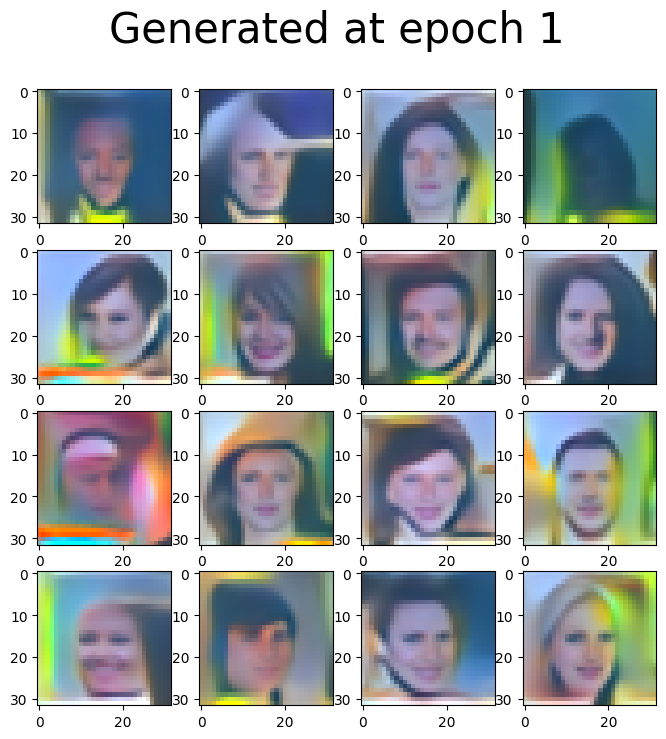

Loss at epoch 1: 0.043 --> Best model ever (stored)


Epoch 2/6:   0%|          | 0/1583 [00:00<?, ?it/s]

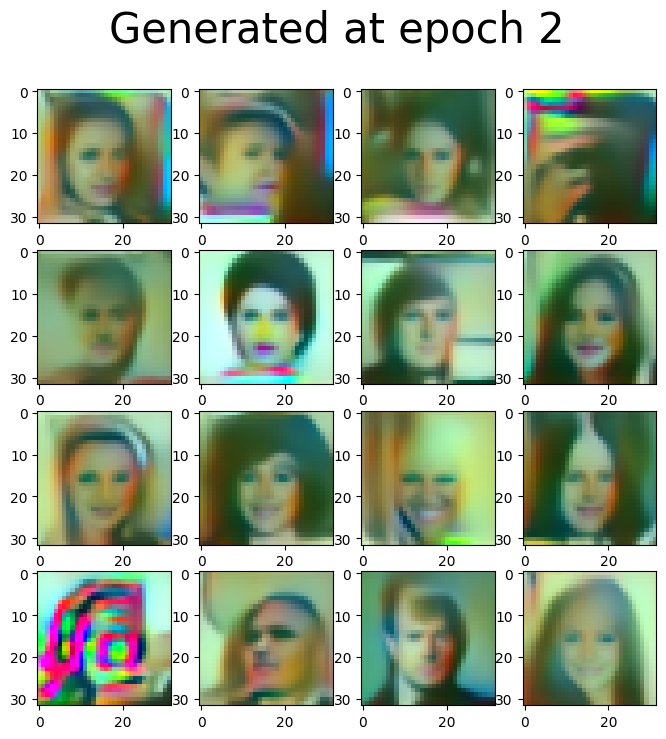

Loss at epoch 2: 0.045


Epoch 3/6:   0%|          | 0/1583 [00:00<?, ?it/s]

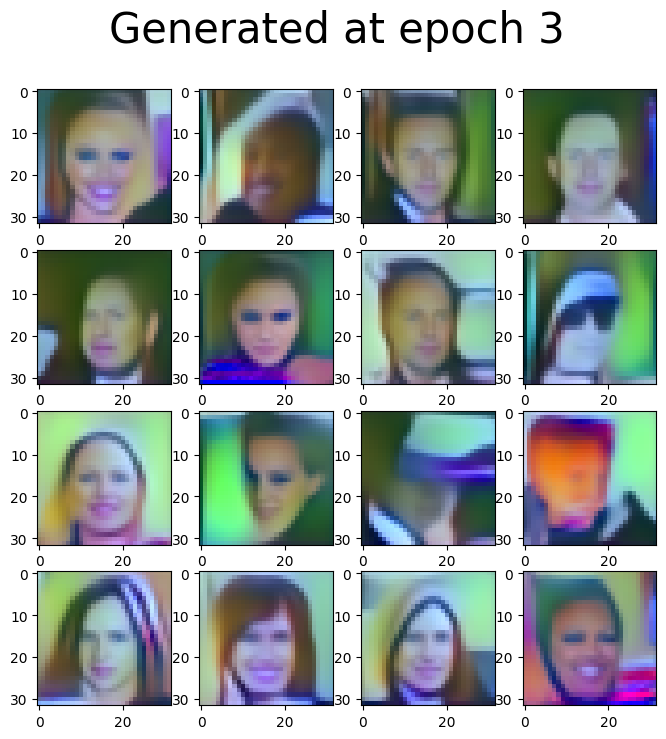

Loss at epoch 3: 0.042 --> Best model ever (stored)


Epoch 4/6:   0%|          | 0/1583 [00:00<?, ?it/s]

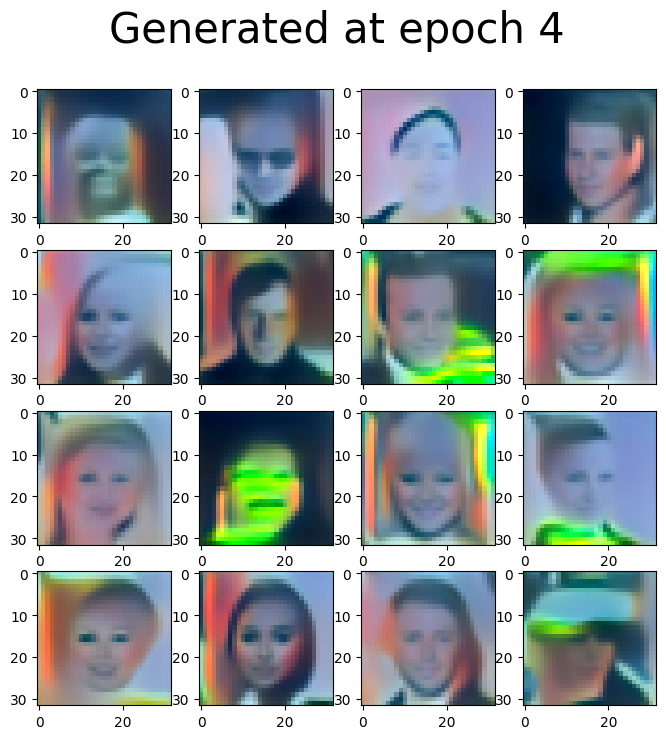

Loss at epoch 4: 0.043


Epoch 5/6:   0%|          | 0/1583 [00:00<?, ?it/s]

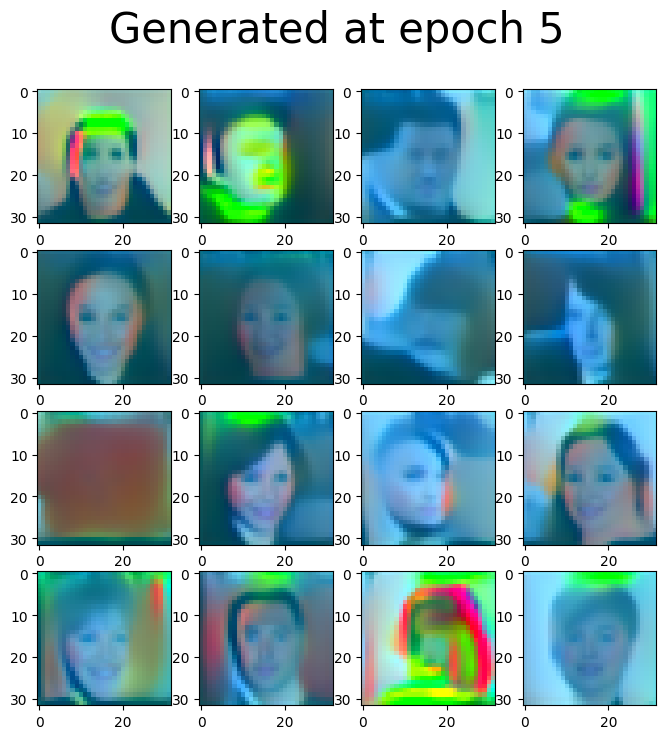

Loss at epoch 5: 0.042 --> Best model ever (stored)


Epoch 6/6:   0%|          | 0/1583 [00:00<?, ?it/s]

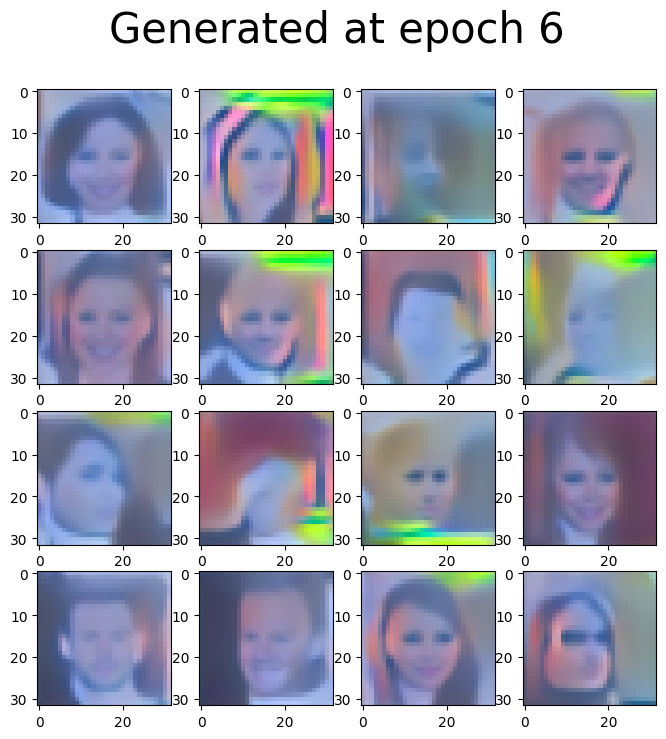

Loss at epoch 6: 0.043


In [34]:
# Обучение
store_path = "/kaggle/working/"
n_epochs = 6
lr = 1.5e-3 
optim=Adam(ddpm.parameters(), lr)
training_loop(ddpm, loader, n_epochs, optim=optim, device=device, store_path=store_path)

In [ ]:
wandb.finish()

# Final results

In [35]:
ddpm.load_state_dict(torch.load("/kaggle/working/ddpm_3.pth"))

<All keys matched successfully>

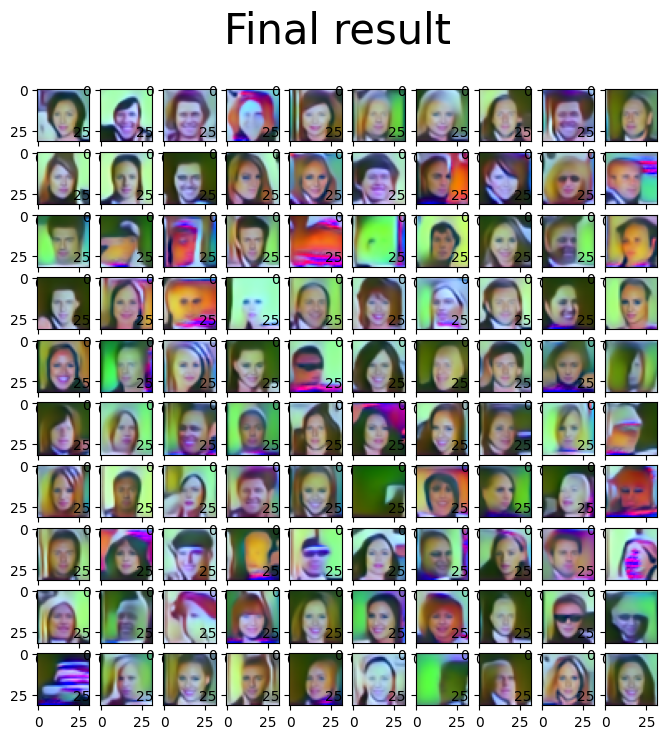

In [37]:
generated = generate_new_images(
        ddpm,
        n_samples=100,
        device=device,
        gif_name="celeba.gif"
    )
show_images(torch.clip(generated, -1, 1), "Final result")

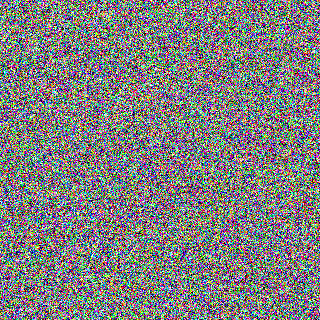

In [38]:
from IPython.display import Image

Image(open('celeba.gif','rb').read())